<a href="https://colab.research.google.com/github/doublelockcup/Pathology-Images-Classification/blob/master/DLfinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#pred = model.predict(train_features)

In [2]:
!apt-get install -q openslide-tools

Reading package lists...
Building dependency tree...
Reading state information...
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 6 not upgraded.
Need to get 92.5 kB of archives.
After this operation, 268 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libopenslide0 amd64 3.4.1+dfsg-2 [79.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 openslide-tools amd64 3.4.1+dfsg-2 [12.7 kB]
Fetched 92.5 kB in 1s (63.8 kB/s)
Selecting previously unselected package libopenslide0.
(Reading database ... 131304 files and directories currently installed.)
Preparing to unpack .../libopenslide0_3.4.1+dfsg-2_amd64.deb ...

In [3]:
!pip install openslide-python

    100% |████████████████████████████████| 317kB 31.4MB/s 
  Stored in directory: /root/.cache/pip/wheels/56/44/7e/16c9fc72cfbf1bffe48676b6835843d21abcc56566e958e7d6
Successfully built openslide-python


In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os 
from PIL import Image
from skimage.color import rgb2gray

##tumor images and masks

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [6]:
!ls '/content/gdrive/My Drive/DeepLearning/datasets/slides'

 tumor_001_mask.tif   tumor_031.xml	   tumor_081.tif
 tumor_001.tif	      tumor_035_mask.tif   tumor_081.xml
 tumor_001.xml	      tumor_035.tif	   tumor_084_mask.tif
 tumor_002_mask.tif   tumor_035.xml	   tumor_084.tif
 tumor_002.tif	     'tumor_038 (1).xml'   tumor_084.xml
 tumor_002.xml	      tumor_038.tif	   tumor_091_mask.tif
 tumor_005_mask.tif   tumor_038.xml	   tumor_091.tif
 tumor_005.tif	      tumor_057_mask.tif   tumor_091.xml
 tumor_005.xml	      tumor_057.tif	   tumor_094_mask.tif
 tumor_012_mask.tif   tumor_057.xml	   tumor_094.tif
 tumor_012.tif	      tumor_059_mask.tif   tumor_094.xml
 tumor_012.xml	      tumor_059.tif	   tumor_096_mask.tif
 tumor_016_mask.tif   tumor_059.xml	   tumor_096.tif
 tumor_016.tif	      tumor_064_mask.tif   tumor_096.xml
 tumor_016.xml	      tumor_064.tif	   tumor_099.xml
 tumor_019_mask.tif   tumor_064.xml	   tumor_101_mask.tif
 tumor_019.tif	      tumor_075_mask.tif   tumor_101.tif
 tumor_019.xml	      tumor_075.tif	   tumor_101.xml
 tumor_02

**using one slide here for prototype**
1. copy the image and the mask from gdrive to colab

In [0]:
# the image and the mask we want to use
slide_path = 'tumor_091.tif'
tumor_mask_path = 'tumor_091_mask.tif'

data_path = 'dataset'
if not os.path.exists(data_path):
  os.mkdir(data_path)

base = '/content/gdrive/My Drive/DeepLearning/datasets/slides'
slide_path = os.path.join(base, slide_path)
tumor_mask_path = os.path.join(base, tumor_mask_path)

#
# slide_path: the path of tumor image
# tumor_mask_path: the path of corresponding mask image

In [0]:
!cp '/content/gdrive/My Drive/DeepLearning/datasets/slides/tumor_091.tif' 'dataset/tumor_091.tif'
!cp '/content/gdrive/My Drive/DeepLearning/datasets/slides/tumor_091_mask.tif' 'dataset/tumor_091_mask.tif'
!ls dataset

tumor_091_mask.tif  tumor_091.tif


2. figure out the down sampling and mapping

We will working on slide object and mask object which contain 8 levels (0 to 7)

In [0]:
slide = open_slide(slide_path)
print('{:20} || width: {} height: {} || number of levels: {}'.format(slide_path.split('/')[-1] , slide.level_dimensions[0][0], slide.level_dimensions[0][1], len(slide.level_dimensions)))
mask = open_slide(tumor_mask_path)
print('{:20} || width: {} height: {} || number of levels: {}'.format(tumor_mask_path.split('/')[-1] , mask.level_dimensions[0][0], mask.level_dimensions[0][1], len(slide.level_dimensions)))

tumor_091.tif        || width: 61440 height: 53760 || number of levels: 8
tumor_091_mask.tif   || width: 61440 height: 53760 || number of levels: 8


In [0]:
for i, (w, h) in enumerate(slide.level_dimensions):
  print('level: {} || width: {:6}  || height: {:6}'.format(i, w, h))

level: 0 || width:  61440  || height:  53760
level: 1 || width:  30720  || height:  26880
level: 2 || width:  15360  || height:  13440
level: 3 || width:   7680  || height:   6720
level: 4 || width:   3840  || height:   3360
level: 5 || width:   1920  || height:   1680
level: 6 || width:    960  || height:    840
level: 7 || width:    480  || height:    420


In [0]:
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

**tumor image at level 6**

level: 6 || width:    960  || height:    840
(840, 960, 3)


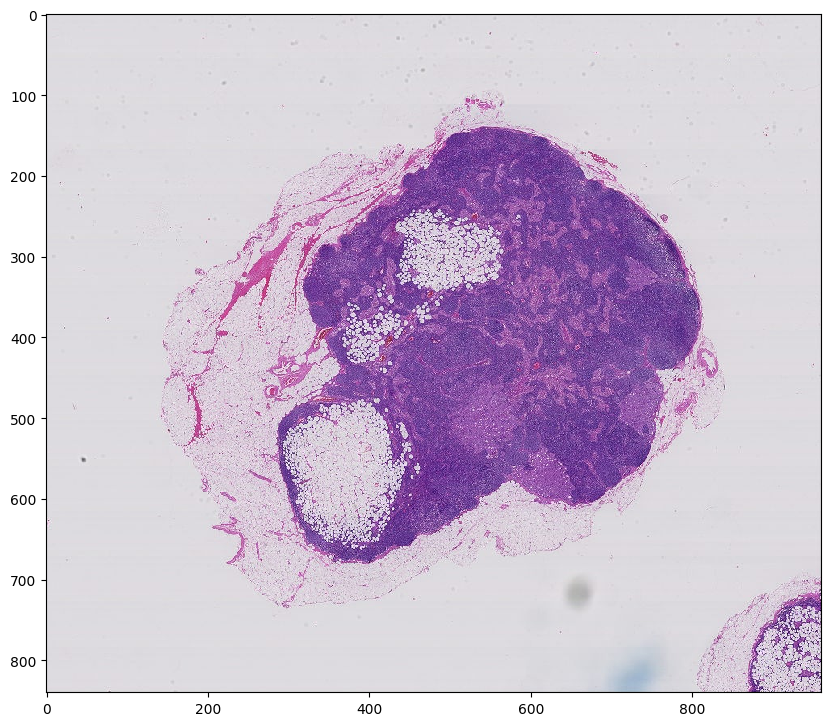

In [0]:
slide_lv6 = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=6, 
                         width=slide.level_dimensions[6][0], 
                         height=slide.level_dimensions[6][1])
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_lv6)
print('level: {} || width: {:6}  || height: {:6}'.format(6, slide.level_dimensions[6][0], slide.level_dimensions[6][1]))
print(slide_lv6.shape) # shape in np array

In [0]:
slide_lv6.shape

(840, 960, 3)

**tumor image at level 5**

level: 5 || width:   1920  || height:   1680
(1680, 1920, 3)


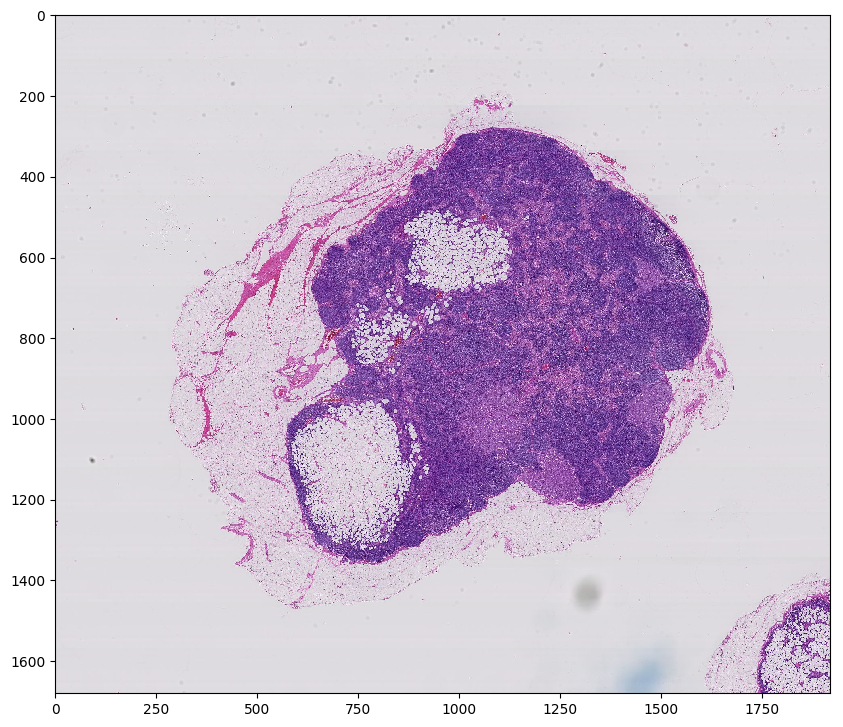

In [0]:
slide_lv5 = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=5, 
                         width=slide.level_dimensions[5][0], 
                         height=slide.level_dimensions[5][1])
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_lv5)
print('level: {} || width: {:6}  || height: {:6}'.format(5, slide.level_dimensions[5][0], slide.level_dimensions[5][1]))
print(slide_lv5.shape) # shape in np array

height is the number of rows

width is the number of columns

therefore in np the shape is (height, width, channel)

3. figure out slide.read_regoin()

```
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im
```

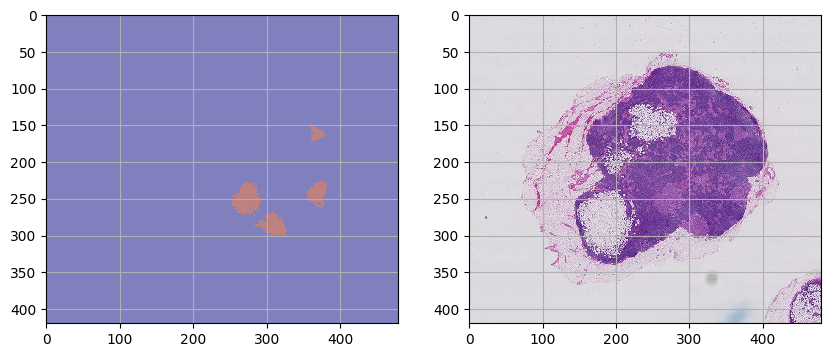

In [0]:
m = read_slide(mask, 
                         x=0, 
                         y=0, 
                         level=7, 
                         width=slide.level_dimensions[7][0], 
                         height=slide.level_dimensions[7][1])[:,:,0]
plt.figure(figsize=(10,10), dpi=100)

plt.subplot(1,2,1)
plt.grid()
plt.imshow(m, cmap='jet', alpha=0.5)
s = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=7, 
                         width=slide.level_dimensions[7][0], 
                         height=slide.level_dimensions[7][1])
plt.subplot(1,2,2)
plt.grid()
plt.imshow(s)

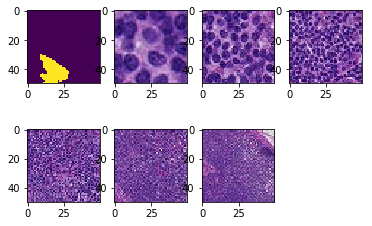

In [0]:
region = read_slide(mask, x=350 * 128, y=120 * 128, level=7, width=50, height=50)[:,:,0]
plt.subplot(2,4,1)
plt.imshow(region)
region = read_slide(slide, x=350 * 128, y=120 * 128, level=1, width=50, height=50)
plt.subplot(2,4,2)
plt.imshow(region)
region = read_slide(slide, x=350 * 128, y=120 * 128, level=2, width=50, height=50)
plt.subplot(2,4,3)
plt.imshow(region)
region = read_slide(slide, x=350 * 128, y=120 * 128, level=3, width=50, height=50)
plt.subplot(2,4,4)
plt.imshow(region)
region = read_slide(slide, x=350 * 128, y=120 * 128, level=4, width=50, height=50)
plt.subplot(2,4,5)
plt.imshow(region)
region = read_slide(slide, x=350 * 128, y=120 * 128, level=5, width=50, height=50)
plt.subplot(2,4,6)
plt.imshow(region)
region = read_slide(slide, x=350 * 128, y=120 * 128, level=6, width=50, height=50)
plt.subplot(2,4,7)
plt.imshow(region)
region = read_slide(slide, x=350 * 128, y=120 * 128, level=7, width=50, height=50)

In [0]:
# s, m : np array, slide and mask image at some level
# x, y : the coordinate you want to scan
# slide, mask: the slide and mask openslide object which contains 8 levels (0 to 7)
# width, height: the returned window size, default 50 * 50
# lv: specify the level of images that the function returns
def deep_scan(slide, mask, x, y, s, m, width=50, height=50, lv=0):
  if not slide or not mask:
    print('feed in slide and mask object(openslide object)\n')
    return
  ALL_LEVEL = 8
  mapping_factor = 128 # mapping (x, y) to the (X, Y) at level 0
  patch = None
  print('slide width (x-axis) {}  || depth (y-axis) {} || channel {}'.format(s.shape[1], s.shape[0], s.shape[2])) # if you use np.shape, remember to swap
  print('slide width (x-axis) {}  || depth (y-axis) {} ||'.format(m.shape[1], m.shape[0]))
  print('deep scan at coordinate: ({:<5} (x-axis), {:<5} (y-aixs))\n'.format(x, y))
  
  # s and m are already np array, not the open-slide object
  if m[y][x]:
    print('this pixel is marked as tumor', '[positive]')
  else:
    print('this pixel is not marked as tumor', '[negative]')
   
  # scan all levels for a (width * height) image
  for i in range(0, ALL_LEVEL):
    plt.subplot(2, 4, i + 1)
    region = read_slide(slide, x=x * mapping_factor, y=y * mapping_factor, level=i, width=width, height=height)
    if i == lv: path = region
    plt.imshow(region)
  
  return patch
  
def get_patch(slide, mask, x, y, s, m, width=50, height=50, lv=0):
  if not slide or not mask:
    print('feed in slide and mask object(openslide object)\n')
    return
  ALL_LEVEL = 8
  mapping_factor = 128 # mapping (x, y) to the (X, Y) at level 0
  patch = read_slide(slide, x=x * mapping_factor, y=y * mapping_factor, level=lv, width=width, height=height)
  return patch

slide width (x-axis) 480  || depth (y-axis) 420 || channel 3
slide width (x-axis) 480  || depth (y-axis) 420 ||
deep scan at coordinate: (304   (x-axis), 295   (y-aixs))

this pixel is marked as tumor [positive]


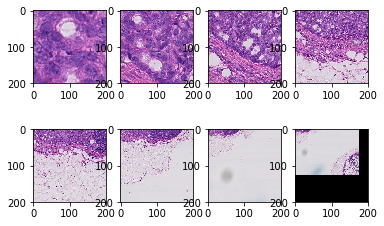

In [0]:
deep_scan(slide, mask, 304, 295, s, m, 200, 200)

(200, 200, 3)


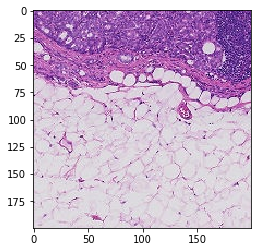

In [0]:
patch = get_patch(slide, mask, 304, 295, s, m, 200, 200, 4)
print(patch.shape)
plt.imshow(patch)

4. working on the most zoomed out imgaes

    4.1. get all locations (x, y) that marked as tumor at the most zoomed out level (level 7)

In [0]:
print(m.shape)
print(s.shape)

(420, 480)
(420, 480, 3)


In [20]:
loc = [(j, i) for i, row in enumerate(m)
              for j, c in enumerate(row) if c]
print(loc[:50])
print('locations found:', len(loc))

def find_tumor_pixels(m):
  return [(j, i) for i, row in enumerate(m)
              for j, c in enumerate(row) if c]

[(346, 58), (348, 58), (349, 58), (350, 58), (351, 58), (352, 58), (353, 58), (354, 58), (355, 58), (356, 58), (357, 58), (343, 59), (344, 59), (345, 59), (346, 59), (347, 59), (348, 59), (349, 59), (350, 59), (351, 59), (352, 59), (353, 59), (354, 59), (355, 59), (356, 59), (357, 59), (342, 60), (343, 60), (344, 60), (345, 60), (346, 60), (347, 60), (348, 60), (349, 60), (350, 60), (351, 60), (352, 60), (353, 60), (354, 60), (355, 60), (356, 60), (357, 60), (325, 61), (326, 61), (327, 61), (328, 61), (329, 61), (330, 61), (331, 61), (332, 61)]
locations found: 64266


    4.2. try to narrow the region, since we don't need to predict on the background
    
    finding the tissue pixel

(array([  0,   0,   3, ..., 419, 419, 419]), array([244, 245, 278, ..., 476, 477, 478]))


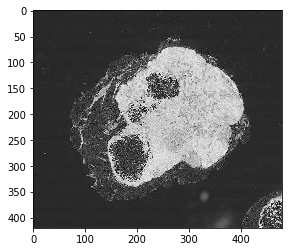

In [0]:
s_gray = rgb2gray(s)
plt.imshow(s_gray, cmap='Greys')
idx = np.where(s_gray <= 0.8)
# the black region (higher intensity) should be the background

In [0]:
# s: the tumor image at some level
# intensity: threshold to filter the image
def find_tissue_pixels(s, intensity=0.8):
  s_gray = rgb2gray(s)
  idx = np.where(s_gray <= intensity)
  return zip(idx[1], idx[0])

In [0]:
loc_tissue = list(find_tissue_pixels(s, 0.8))
print(loc_tissue[:50])
print('tissue piexels found {} ({:.2f}%)'.format(len(loc_tissue), 100 * (len(loc_tissue) / s.shape[0] / s.shape[1])))

[(244, 0), (245, 0), (278, 3), (184, 5), (244, 5), (245, 5), (244, 6), (245, 6), (197, 7), (198, 7), (199, 7), (240, 7), (416, 7), (240, 8), (241, 8), (240, 9), (275, 12), (385, 12), (386, 12), (275, 13), (385, 13), (386, 13), (217, 15), (218, 15), (218, 16), (256, 16), (257, 16), (264, 18), (391, 18), (152, 19), (153, 19), (390, 19), (391, 19), (362, 20), (391, 20), (274, 21), (341, 24), (341, 25), (338, 31), (339, 31), (337, 32), (338, 32), (233, 34), (234, 34), (232, 35), (233, 35), (234, 35), (233, 36), (285, 37), (332, 37)]
tissue piexels found 62589 (31.05%)


check if we found the right location

In [0]:
# generate mask for a slide image
def gen_mask(s, loc, color=(255, 0, 0)):
  mask = np.zeros(shape=s.shape)
  for j, i in loc:
    mask[i][j] = color
  return mask

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


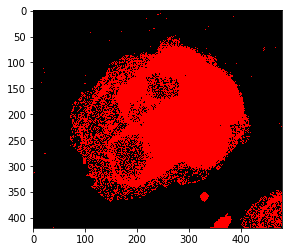

In [0]:
s_mask = gen_mask(s, loc_tissue)
plt.imshow(s_mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


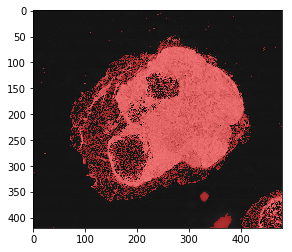

In [0]:
# mask on our gray image
plt.imshow(s_gray, cmap='Greys')
plt.imshow(s_mask, alpha=0.5)

The goal is build a classification model that classify points above at the tumor image (not the mask) to 1.

We are ready to go.

## The training set

In [0]:
slide, mask

(OpenSlide('/content/gdrive/My Drive/DeepLearning/datasets/slides/tumor_091.tif'),
 OpenSlide('/content/gdrive/My Drive/DeepLearning/datasets/slides/tumor_091_mask.tif'))

<em>§§ Add training slide and mask here (openslide object)</em>

In [0]:
train = [(slide, mask)]

In [0]:
train_images = []
train_labels = []  

put it together

62589
2924 (4.671747%)

slide width (x-axis) 480  || depth (y-axis) 420 || channel 3
slide width (x-axis) 480  || depth (y-axis) 420 ||
deep scan at coordinate: (290   (x-axis), 280   (y-aixs))

this pixel is marked as tumor [positive]


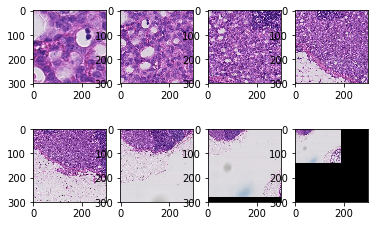

In [0]:
s = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=7, 
                         width=slide.level_dimensions[7][0], 
                         height=slide.level_dimensions[7][1])
m = read_slide(mask, 
                         x=0, 
                         y=0, 
                         level=7, 
                         width=slide.level_dimensions[7][0], 
                         height=slide.level_dimensions[7][1])[:,:,0]

loc_tissue = list(find_tissue_pixels(s, 0.8))
print(len(loc_tissue))
loc_tumor = find_tumor_pixels(m)
print(len(loc_tumor), '({:2f}%)\n'.format(100 * len(loc_tumor)/len(loc_tissue)))


# def get_patch(slide, mask, x, y, s, m, width=50, height=50, lv=0)
# def deep_scan(slide, mask, x, y, s, m, width=50, height=50, lv=0)
import random
deep_scan(slide, mask, *random.choice(loc_tumor), s, m, 299, 299)


slide width (x-axis) 480  || depth (y-axis) 420 || channel 3
slide width (x-axis) 480  || depth (y-axis) 420 ||
deep scan at coordinate: (225   (x-axis), 127   (y-aixs))

this pixel is not marked as tumor [negative]


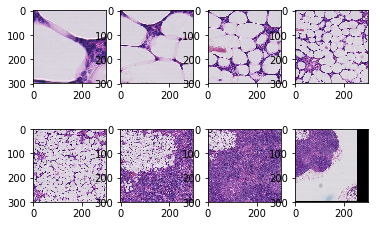

In [0]:
deep_scan(slide, mask, *random.choice(loc_tissue), s, m, 299, 299, 0)

In [0]:
# patch = get_patch(slide, mask, 304, 295, s, m, 200, 200, 4) # factor is 128, we need to change it if we want to work on other levels
loc_tissue = set(loc_tissue)
loc_tumor = set(loc_tumor)
loc_normal = loc_tissue - loc_tumor
print('tissue: {} tumor: {} normal {}'.format(len(loc_tissue), len(loc_tumor), len(loc_normal))) # some pixels are filtered out so tumor + normal not equals tissue
images = []
labels = []
for loc in loc_tumor:
  patch = get_patch(slide, mask, *loc, s, m, 299, 299, 4) # seems we don't need s and m to get the patch, refactor it
  images.append(patch)
  labels.append(1)


tissue: 62589 tumor: 2924 normal 59667


In [0]:
#images = np.array(images)
#labels = np.array(labels)
#print(images.shape)
#print(labels.shape)

(2924, 299, 299, 3)
(2924,)


In [0]:
# balance the positive and the negative training data
normal = list(loc_normal)
random.shuffle(normal)
for loc in normal[:len(loc_tumor)]:
  patch = get_patch(slide, mask, *loc, s, m, 299, 299, 4) # seems we don't need s and m to get the patch, refactor it
  images.append(patch)
  labels.append(0)  


In [0]:
images = np.array(images)
labels = np.array(labels)
print(images.shape)
print(labels.shape)

(5848, 299, 299, 3)
(5848,)


Inspect the data

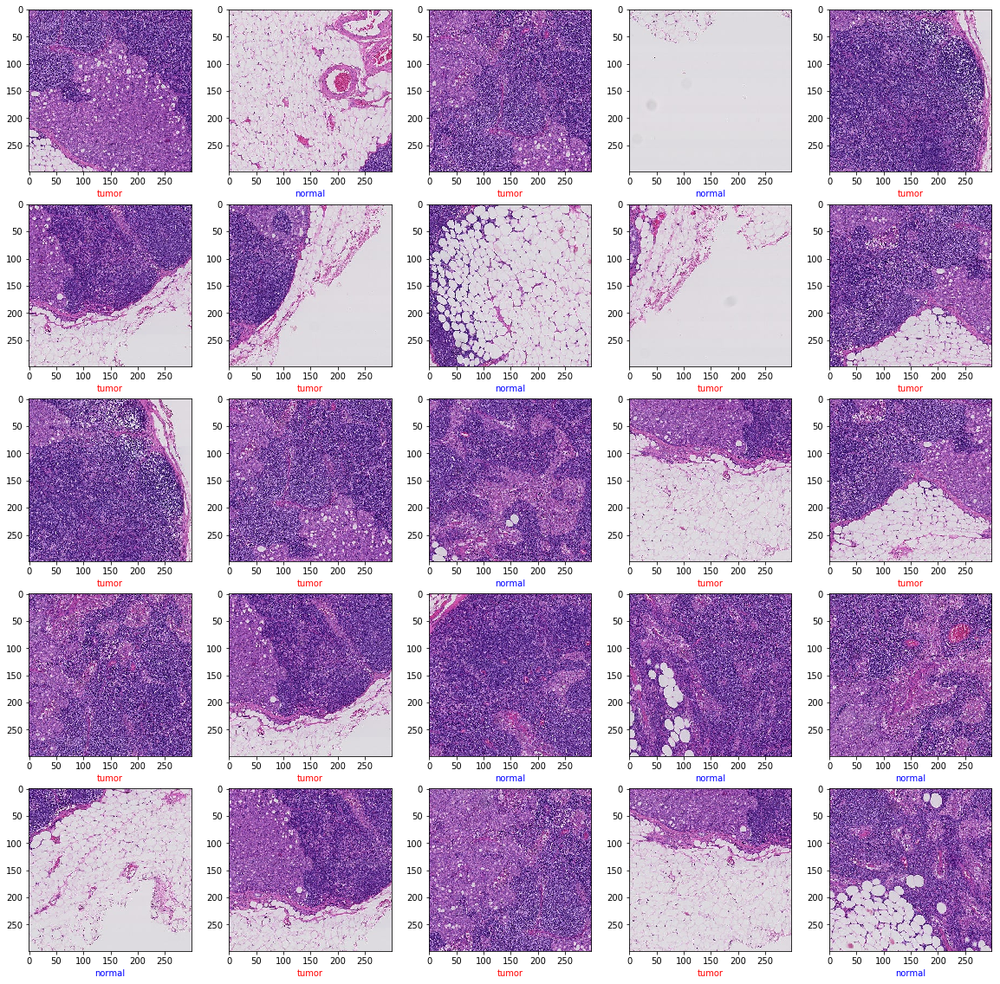

In [0]:
#idx = random.randint(0, len(labels))
#x = images[idx]
#y = labels[idx]
#print('label:', y)
#plt.xlabel('{}'.format(y), color='blue')
#plt.imshow(x)

def _plot_image(x, y):
  plt.imshow(x)
  label = 'tumor' if y else 'normal'
  color = 'red' if y else 'blue'
  plt.xlabel('{}'.format(label), color=color)

num_cols = 5
num_rows = 5
plt.figure(figsize=(2*2*num_cols, 2*2*num_rows))
for i in range(25):
  plt.subplot(5, 5, i + 1)
  idx = random.randint(0, len(labels))
  x = images[idx]
  y = labels[idx]
  _plot_image(x, y)
  



## The model

Transfer Learning on Inception V3

In [0]:
print(images.shape)
print(labels.shape)

(5848, 299, 299, 3)
(5848,)


In [7]:
import tensorflow as tf
print(tf.__version__)

1.13.1


In [8]:
from tensorflow.keras.applications import ResNet50, InceptionV3
conv_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))


Instructions for updating:
Colocations handled automatically by placer.
87916544/87910968 [==============================] - 1s 0us/step


In [0]:
conv_base.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_v1 (BatchNo (None, 149, 149, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 149, 149, 32) 0           batch_normalization_v1[0][0]     
__________________________________________________________________________________________________
conv2d_1 (

In [0]:
features = conv_base.predict(images)

In [0]:
print(features.shape)

(5848, 8, 8, 2048)


In [0]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import RMSprop

train_features = np.reshape(features, (len(features), -1))
print(train_features.shape)

model = Sequential()
model.add(Dense(256, activation='relu', input_dim=8*8*2048))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer=RMSprop(lr=2e-3), loss='binary_crossentropy', metrics=['acc'])

(5848, 131072)
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
history = model.fit(train_features, labels, epochs=20, batch_size=128, validation_split=0.2)

Train on 4678 samples, validate on 1170 samples
Epoch 1/20
4678/4678 [==============================] - 4s 780us/sample - loss: 5.9775 - acc: 0.6251 - val_loss: 15.9424 - val_acc: 0.0000e+00
Epoch 2/20
4678/4678 [==============================] - 4s 817us/sample - loss: 5.9775 - acc: 0.6251 - val_loss: 15.9424 - val_acc: 0.0000e+00
Epoch 3/20
4678/4678 [==============================] - 4s 816us/sample - loss: 5.9750 - acc: 0.6251 - val_loss: 15.9344 - val_acc: 0.0000e+00
Epoch 4/20
4678/4678 [==============================] - 4s 813us/sample - loss: 5.2247 - acc: 0.6531 - val_loss: 2.4141 - val_acc: 0.7991
Epoch 5/20
4678/4678 [==============================] - 4s 800us/sample - loss: 1.7477 - acc: 0.8572 - val_loss: 4.1859 - val_acc: 0.6316
Epoch 6/20
4678/4678 [==============================] - 4s 805us/sample - loss: 1.1644 - acc: 0.9027 - val_loss: 5.7825 - val_acc: 0.5368
Epoch 7/20
4678/4678 [==============================] - 4s 802us/sample - loss: 0.8856 - acc: 0.9224 - val_lo

In [0]:
def plot_history(history):
  acc = history.history['acc']
  val_acc = history.history['val_acc']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc) + 1)
  plt.plot(epochs, acc, 'bo', label='Training acc')
  plt.plot(epochs, val_acc, 'b', label='Validation acc')
  plt.title('Training and Validation accuracy')
  plt.legend()
  plt.figure()
  plt.plot(epochs, loss, 'bo', label='Training loss')
  plt.plot(epochs, val_loss, 'b', label='Validation loss')
  plt.title('Training and Validation loss')
  plt.legend()
  plt.show()

  
  

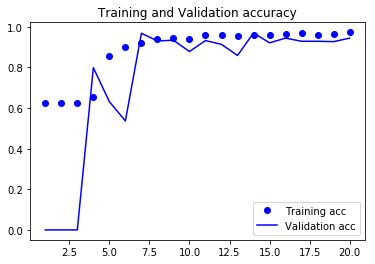

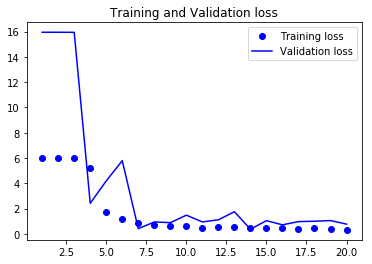

In [0]:
plot_history(history)

**genrate mask using the trained model**

In [0]:
pred = model.predict(train_features)
print(pred.shape)
print(pred[0])

(5848, 1)
[0.99999976]


In [0]:
l0 = list(loc_tissue)[11]
p0 = get_patch(slide, mask, *l0, s, m, 299, 299, 4)
print(p0.shape)
p0 = np.expand_dims(p0, axis=0)
print(p0.shape)
#f0 = conv_base.predict(p0)
f0 = conv_base.predict(p0)
print(f0.shape)
f0 = np.reshape(f0, (1, -1))
print(f0.shape)
pred0 = model.predict(f0)
print(pred0.shape, pred0)
pred0[0][0]

(299, 299, 3)
(1, 299, 299, 3)
(1, 8, 8, 2048)
(1, 131072)
(1, 1) [[1.]]


1.0

In [0]:
loc_pred = []
for i, loc in enumerate(list(loc_tissue)):
  print('predict: {} / {}'.format(i+1, len(loc_tissue)))
  patch = get_patch(slide, mask, *loc, s, m, 299, 299, 4)
  patch = np.expand_dims(patch, axis=0)
  feature = conv_base.predict(patch)
  feature = np.reshape(feature, (1, -1))
  pred = model.predict(feature)[0][0]
  if pred > 0.5:
    loc_pred.append(loc)

predict: 1 / 62589
predict: 2 / 62589
predict: 3 / 62589
predict: 4 / 62589
predict: 5 / 62589
predict: 6 / 62589
predict: 7 / 62589
predict: 8 / 62589
predict: 9 / 62589
predict: 10 / 62589
predict: 11 / 62589
predict: 12 / 62589
predict: 13 / 62589
predict: 14 / 62589
predict: 15 / 62589
predict: 16 / 62589
predict: 17 / 62589
predict: 18 / 62589
predict: 19 / 62589
predict: 20 / 62589
predict: 21 / 62589
predict: 22 / 62589
predict: 23 / 62589
predict: 24 / 62589
predict: 25 / 62589
predict: 26 / 62589
predict: 27 / 62589
predict: 28 / 62589
predict: 29 / 62589
predict: 30 / 62589
predict: 31 / 62589
predict: 32 / 62589
predict: 33 / 62589
predict: 34 / 62589
predict: 35 / 62589
predict: 36 / 62589
predict: 37 / 62589
predict: 38 / 62589
predict: 39 / 62589
predict: 40 / 62589
predict: 41 / 62589
predict: 42 / 62589
predict: 43 / 62589
predict: 44 / 62589
predict: 45 / 62589
predict: 46 / 62589
predict: 47 / 62589
predict: 48 / 62589
predict: 49 / 62589
predict: 50 / 62589
predict: 

In [0]:
print("points predicted as tumor", len(loc_pred))
print("actual points marked as tumor", len(loc_tumor))

points predicted as tumor 6091
actual points marked as tumor 2924


In [0]:
# generate mask for a slide image
#def gen_mask(s, loc, color=(255, 0, 0)):
s_mask = gen_mask(s, loc_pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


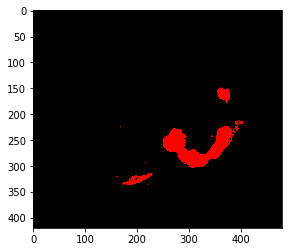

In [0]:
plt.imshow(s_mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'comparison')

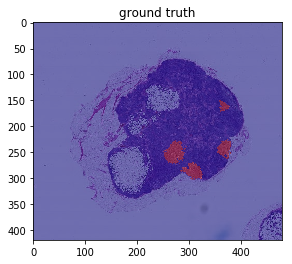

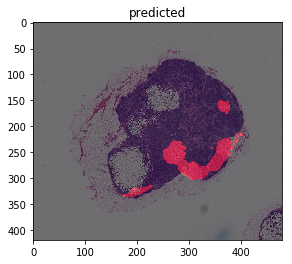

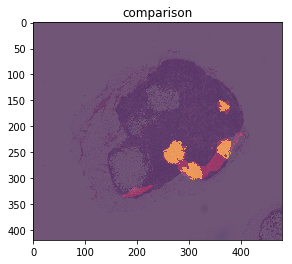

In [0]:
plt.figure()
plt.imshow(s)
plt.imshow(m, cmap='jet',alpha=0.5)
plt.title('ground truth')

plt.figure()
plt.imshow(s)
plt.imshow(s_mask, cmap='jet', alpha=0.5)
plt.title('predicted')

plt.figure()
plt.imshow(s, alpha=0.5)

plt.imshow(s_mask, alpha=0.4)
plt.imshow(m, alpha=0.4)
plt.title('comparison')

-- we need some metric to quantify the performance, slide level or dataset level
-- current scan level is 4, we can try a different level
-- we could adjust the model
-- we could increase the taining set by adding more slides
-- data augmentaion
-- training step, learning rate
-- and more

## Test on another slide

In [0]:
del slide
del mask

In [12]:
slide_path = 'tumor_110.tif'
tumor_mask_path = 'tumor_110_mask.tif'
base = '/content/gdrive/My Drive/DeepLearning/datasets/slides'
slide_path = os.path.join(base, slide_path)
tumor_mask_path = os.path.join(base, tumor_mask_path)

!cp '/content/gdrive/My Drive/DeepLearning/datasets/slides/tumor_110.tif' 'dataset/tumor_110.tif'
!cp '/content/gdrive/My Drive/DeepLearning/datasets/slides/tumor_110_mask.tif' 'dataset/tumor_110_mask.tif'
!ls dataset

slide = open_slide(slide_path)
print('{:20} || width: {} height: {} || number of levels: {}'.format(slide_path.split('/')[-1] , slide.level_dimensions[0][0], slide.level_dimensions[0][1], len(slide.level_dimensions)))
mask = open_slide(tumor_mask_path)
print('{:20} || width: {} height: {} || number of levels: {}'.format(tumor_mask_path.split('/')[-1] , mask.level_dimensions[0][0], mask.level_dimensions[0][1], len(slide.level_dimensions)))


tumor_110_mask.tif  tumor_110.tif
tumor_110.tif        || width: 94208 height: 71680 || number of levels: 9
tumor_110_mask.tif   || width: 94208 height: 71680 || number of levels: 9


In [13]:
for i, (w, h) in enumerate(slide.level_dimensions):
  print('level: {} || width: {:6}  || height: {:6}'.format(i, w, h))

level: 0 || width:  94208  || height:  71680
level: 1 || width:  47104  || height:  35840
level: 2 || width:  23552  || height:  17920
level: 3 || width:  11776  || height:   8960
level: 4 || width:   5888  || height:   4480
level: 5 || width:   2944  || height:   2240
level: 6 || width:   1472  || height:   1120
level: 7 || width:    736  || height:    560
level: 8 || width:    368  || height:    280


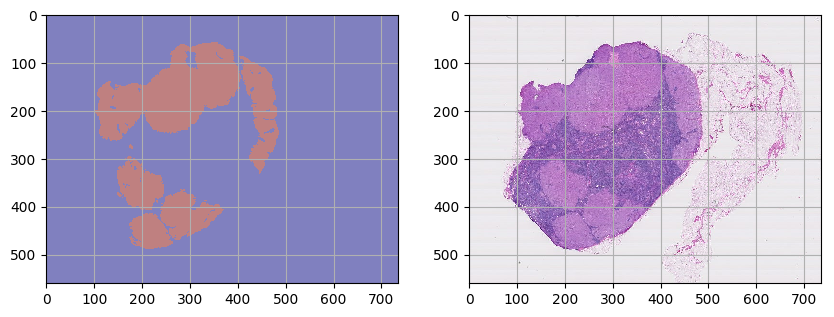

In [17]:
m = read_slide(mask, 
                         x=0, 
                         y=0, 
                         level=7, 
                         width=slide.level_dimensions[7][0], 
                         height=slide.level_dimensions[7][1])[:,:,0]
plt.figure(figsize=(10,10), dpi=100)

plt.subplot(1,2,1)
plt.grid()
plt.imshow(m, cmap='jet', alpha=0.5)
s = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=7, 
                         width=slide.level_dimensions[7][0], 
                         height=slide.level_dimensions[7][1])
plt.subplot(1,2,2)
plt.grid()
plt.imshow(s)

In [0]:
import gc
gc.collect()

21046

The shape is different among slides at all levels

In [30]:
# find tissue pixels
loc_tissue = list(find_tissue_pixels(s, 0.8))
print(loc_tissue[:50])
print('tissue piexels found {} ({:.2f}%)'.format(len(loc_tissue), 100 * (len(loc_tissue) / s.shape[0] / s.shape[1])))

[(74, 0), (75, 1), (217, 1), (75, 2), (76, 2), (218, 2), (219, 2), (431, 2), (432, 2), (76, 3), (77, 3), (78, 3), (219, 3), (220, 3), (221, 3), (222, 3), (230, 3), (231, 3), (77, 4), (78, 4), (79, 4), (220, 4), (221, 4), (222, 4), (223, 4), (224, 4), (225, 4), (226, 4), (227, 4), (228, 4), (229, 4), (230, 4), (78, 5), (79, 5), (80, 5), (224, 5), (225, 5), (226, 5), (227, 5), (79, 6), (80, 6), (81, 6), (81, 7), (82, 7), (83, 7), (84, 7), (85, 7), (86, 7), (725, 7), (82, 8)]
tissue piexels found 137357 (33.33%)


64266 (46.787568%)

slide width (x-axis) 736  || depth (y-axis) 560 || channel 3
slide width (x-axis) 736  || depth (y-axis) 560 ||
deep scan at coordinate: (140   (x-axis), 176   (y-aixs))

this pixel is marked as tumor [positive]


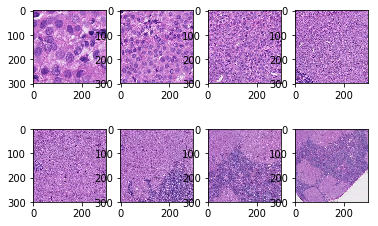

In [31]:
# find tumor pixels
loc_tumor = find_tumor_pixels(m)
print(len(loc_tumor), '({:2f}%)\n'.format(100 * len(loc_tumor)/len(loc_tissue)))


# def get_patch(slide, mask, x, y, s, m, width=50, height=50, lv=0)
# def deep_scan(slide, mask, x, y, s, m, width=50, height=50, lv=0)
import random
deep_scan(slide, mask, *random.choice(loc_tumor), s, m, 299, 299)



as long as the slide has at least 8 layers, layer 7 to layer 0, we can still use the mapping factor 128

In [32]:
# patch = get_patch(slide, mask, 304, 295, s, m, 200, 200, 4) # factor is 128, we need to change it if we want to work on other levels
loc_tissue = set(loc_tissue)
loc_tumor = set(loc_tumor)
loc_normal = loc_tissue - loc_tumor
print('tissue: {} tumor: {} normal {}'.format(len(loc_tissue), len(loc_tumor), len(loc_normal))) # some pixels are filtered out so tumor + normal not equals tissue


tissue: 137357 tumor: 64266 normal 73124


In [0]:
!cp '/content/gdrive/My Drive/DeepLearning/datasets/model_first.h5' 'model_first.h5'

In [36]:
model = tf.keras.models.load_model('model_first.h5')

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [38]:
# make prediction
import time
loc_pred = []
t0 = time.time()
total = len(loc_tissue)
for i, loc in enumerate(list(loc_tissue)):
  t1 = time.time()
  patch = get_patch(slide, mask, *loc, s, m, 299, 299, 4)
  patch = np.expand_dims(patch, axis=0)
  feature = conv_base.predict(patch)
  feature = np.reshape(feature, (1, -1))
  pred = model.predict(feature)[0][0]
  if pred > 0.5:
    loc_pred.append(loc)
  t2 = time.time()
  if i % 1000 == 0:
    print('predict: {:<7} / {:<7} ({:.1f}%)  || time elapsed {:.3f}s  remaining {:.3f}s'.format(i+1, len(loc_tissue), 100 * (i+1) / len(loc_tissue), t2 - t0, (t2 - t1) * (total - i)))

predict: 1       / 137357  (0.0%)  || time elapsed 0.069s  remaining 8355.279s
predict: 1001    / 137357  (0.7%)  || time elapsed 38.273s  remaining 6147.812s
predict: 2001    / 137357  (1.5%)  || time elapsed 75.599s  remaining 4855.104s
predict: 3001    / 137357  (2.2%)  || time elapsed 113.530s  remaining 4579.755s
predict: 4001    / 137357  (2.9%)  || time elapsed 149.129s  remaining 4400.939s
predict: 5001    / 137357  (3.6%)  || time elapsed 188.012s  remaining 4337.770s
predict: 6001    / 137357  (4.4%)  || time elapsed 223.973s  remaining 4270.108s
predict: 7001    / 137357  (5.1%)  || time elapsed 262.939s  remaining 6737.731s
predict: 8001    / 137357  (5.8%)  || time elapsed 301.902s  remaining 4589.219s
predict: 9001    / 137357  (6.6%)  || time elapsed 342.003s  remaining 5495.111s
predict: 10001   / 137357  (7.3%)  || time elapsed 382.290s  remaining 5354.315s
predict: 11001   / 137357  (8.0%)  || time elapsed 418.640s  remaining 5092.083s
predict: 12001   / 137357  (8.7%

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


points predicted as tumor 11826
actual points marked as tumor 64266


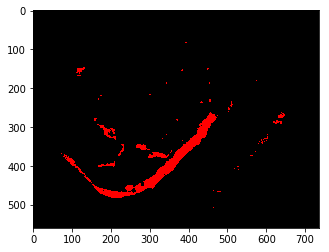

In [41]:
print("points predicted as tumor", len(loc_pred))
print("actual points marked as tumor", len(loc_tumor))
# generate mask for a slide image
#def gen_mask(s, loc, color=(255, 0, 0)):
s_mask = gen_mask(s, loc_pred)
plt.imshow(s_mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'comparison')

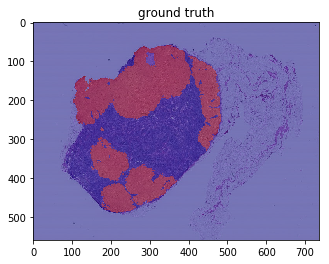

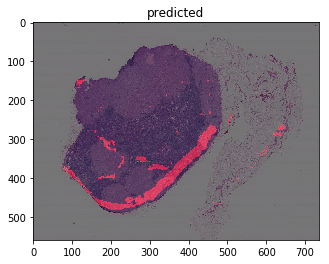

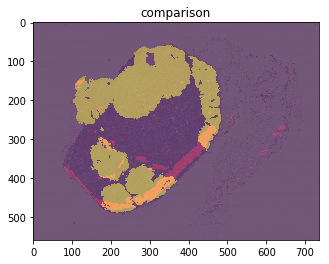

In [42]:


plt.figure()
plt.imshow(s)
plt.imshow(m, cmap='jet',alpha=0.5)
plt.title('ground truth')

plt.figure()
plt.imshow(s)
plt.imshow(s_mask, cmap='jet', alpha=0.5)
plt.title('predicted')

plt.figure()
plt.imshow(s, alpha=0.5)

plt.imshow(s_mask, alpha=0.4)
plt.imshow(m, alpha=0.4)
plt.title('comparison')

## save the model

In [0]:
model.save('model_first.h5')

In [0]:
!ls 
!cp 'model_first.h5' '/content/gdrive/My Drive/DeepLearning/datasets/model_first.h5'
# load model
# new_model = keras.models.load_model('my_model.h5')
# new_model.summary()

dataset  gdrive  model_first.h5  sample_data
